In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ultranest
import read_beam_FEKO as rf
import scipy.interpolate
import scipy.optimize
%matplotlib notebook

In [2]:
o = rf.read_beam_FEKO('nominal.out',0)

 Frequency in Hz:               FREQ =    2.50000E+07

 Frequency in Hz:               FREQ =    2.60000E+07

 Frequency in Hz:               FREQ =    2.70000E+07

 Frequency in Hz:               FREQ =    2.80000E+07

 Frequency in Hz:               FREQ =    2.90000E+07

 Frequency in Hz:               FREQ =    3.00000E+07

 Frequency in Hz:               FREQ =    3.10000E+07

 Frequency in Hz:               FREQ =    3.20000E+07

 Frequency in Hz:               FREQ =    3.30000E+07

 Frequency in Hz:               FREQ =    3.40000E+07

 Frequency in Hz:               FREQ =    3.50000E+07

 Frequency in Hz:               FREQ =    3.60000E+07

 Frequency in Hz:               FREQ =    3.70000E+07

 Frequency in Hz:               FREQ =    3.80000E+07

 Frequency in Hz:               FREQ =    3.90000E+07

 Frequency in Hz:               FREQ =    4.00000E+07

 Frequency in Hz:               FREQ =    4.10000E+07

 Frequency in Hz:               FREQ =    4.20000E+07

 Frequency

In [3]:
theta = 90 - o[2]
phi = o[1]
freq = o[0]
gain = o[5]
theta2, phi2 = np.meshgrid(theta, phi)
theta = theta2.flatten()
phi = phi2.flatten()

In [4]:
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta2*np.pi/180*np.cos(phi2*np.pi/180))**2/2/sigx**2 - (theta2*np.pi/180*np.sin(phi2*np.pi/180))**2/2/sigy**2) 
# Define model to simulate data
def model1(paras):
    A, sigx, sigy = paras
    return Gaussian2D(A,sigx,sigy).T

In [22]:
sigma = np.std(gain[0])
param_names = ['A', 'sigx', 'sigy']
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 10
    params[0] = cube[0] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo
    
    return params
def my_likelihood(params):
    mo = model1(params)
    diff = mo - gain[0]
    return -0.5 * np.sum((diff/sigma)**2)

In [23]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run(min_num_live_points=200)
sampler.print_results()

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .79 [-185.8443..-185.8436]*| it/evals=4455/9055 eff=50.3106% N=200          0   0  
[ultranest] Likelihood function evaluations: 9055
[ultranest]   logZ = -203.5 +- 0.2455
[ultranest] Effective samples strategy satisfied (ESS = 954.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.61, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.

logZ = -203.490 +- 0.606
  single instance: logZ = -203.490 +- 0.284
  bootstrapped   : logZ = -203.463 +- 0.606
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    A                   : 0.5280│ ▁▁▁▁▁▁▁▁▂▂▄▃▄▆▆▇▇▇▇▇▆▆▄▃▂▂▁▁▁▁▁▁▁▁ ▁▁ │0.5438    0.5354 +- 0.0020
    sigx                : 0.6449│ ▁ ▁▁▁▁▁▁▁▂▂▄▆▅▆▆▆▇▇▇▅▆▇▅▅▃▂▂▂▁▁▁▁▁▁▁▁ │0.6775  

In [ ]:
#obtain ratio from slices
#compress the axis for all frequencies
#compute TDH
#Show residual in 1D cartesian representation
#Do everything in 1D array (change at the beginning)
#plot scatter plots only

In [24]:
#obtain ratio from slices
first = gain[0].T[0]
last = gain[0].T[90]
x = np.flip(theta[:91])
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
xnew = np.linspace(0,90,90000)
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))

In [25]:
def index_nearest(array, value):
    """
    return index of array *nearest* to value

    >>> ix = index_nearest(array, value)

    Arguments
    ---------
    array  (ndarray-like):  array to find index in
    value  (float): value to find index of

    Returns
    -------
    integer for index in array nearest value

    """
    return np.abs(array-value).argmin()

In [26]:
index_nearest(inter1,np.max(gain[0])/2),index_nearest(inter2,np.max(gain[0])/2)

(44449, 38719)

In [28]:
sigy = index_nearest(inter1,np.max(gain[0])/2)
sigx = index_nearest(inter2,np.max(gain[0])/2)
ratio = sigy/sigx
ratio

1.1479893592293189

<IPython.core.display.Javascript object>


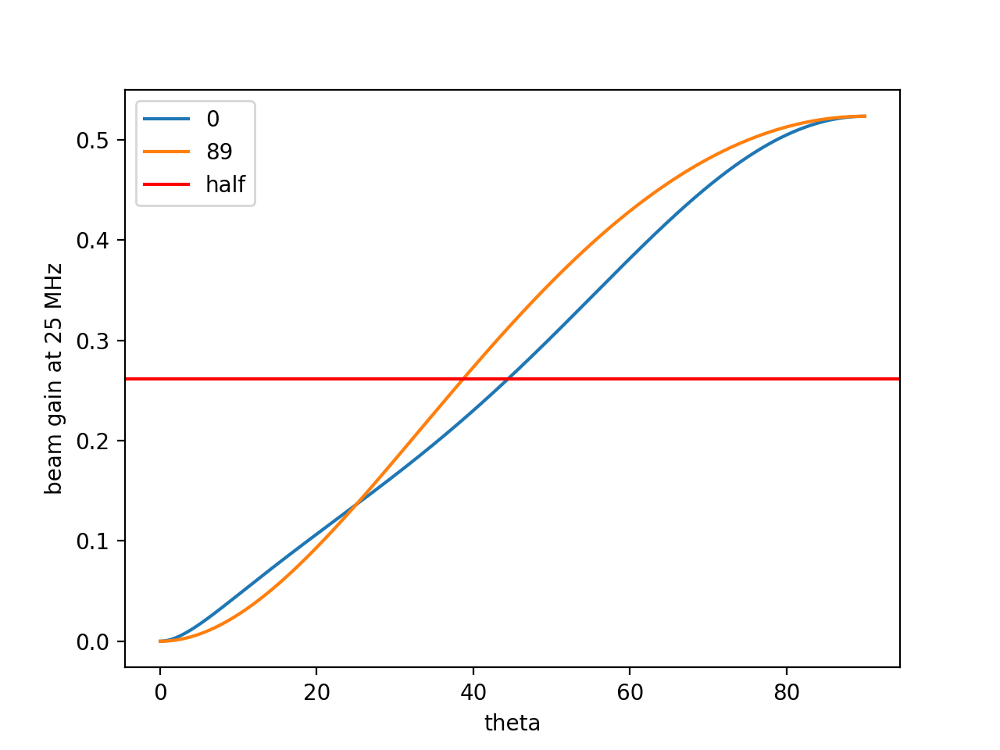

In [29]:
plt.figure(0)
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "89")
plt.axhline(y = np.max(gain[0]/2), color='r', linestyle='-', label = "half")
plt.xlabel("theta")
plt.ylabel("beam gain at 25 MHz")
plt.legend()

<IPython.core.display.Javascript object>


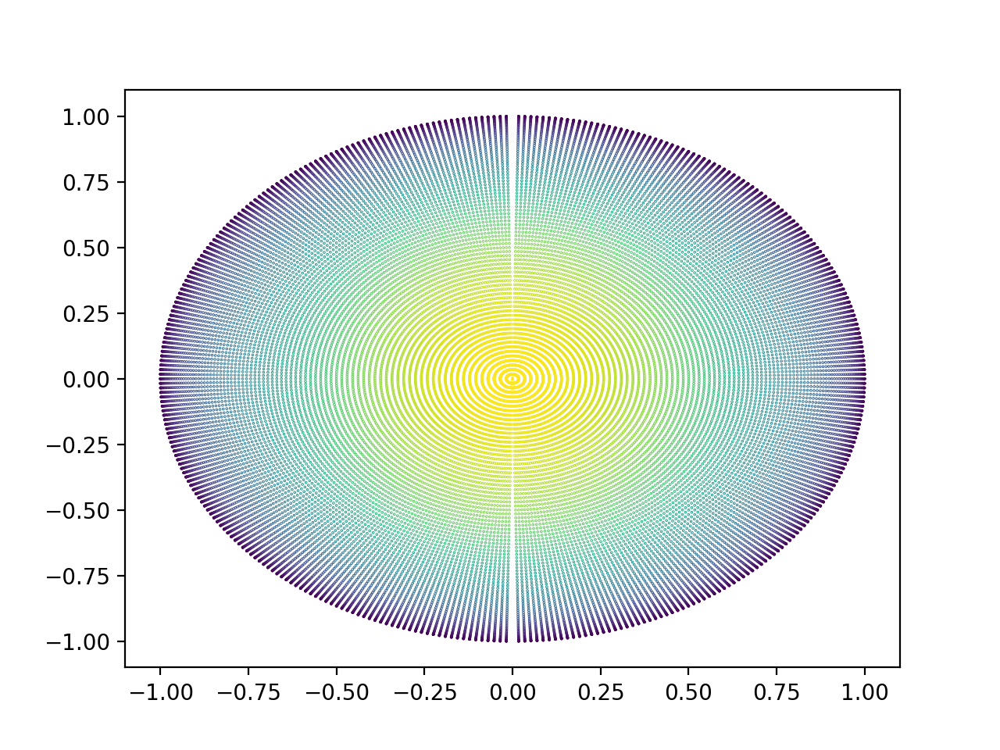

In [44]:
plt.figure(2)
truncatephi = np.append(phi[0:91*90],phi[91*91:])
truncatephi = np.append(truncatephi[0:91*269],truncatephi[91*270:])
truncatetheta = np.append(theta[0:91*90],theta[91*91:])
truncatetheta = np.append(truncatetheta[0:91*269],truncatetheta[91*270:])
truncategain = np.append(gain[0].T.ravel()[0:91*90],gain[0].T.ravel()[91*91:])
truncategain = np.append(truncategain[0:91*269],truncategain[91*270:])
x = np.cos(truncatephi*np.pi/180)*np.sin(truncatetheta*np.pi/180)
y = np.sin(truncatephi*np.pi/180)*np.sin(truncatetheta*np.pi/180)
xw = np.cos(phi*np.pi/180)*np.sin(theta*np.pi/180)
yw = np.sin(phi*np.pi/180)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = truncategain, s = 0.1)

<IPython.core.display.Javascript object>


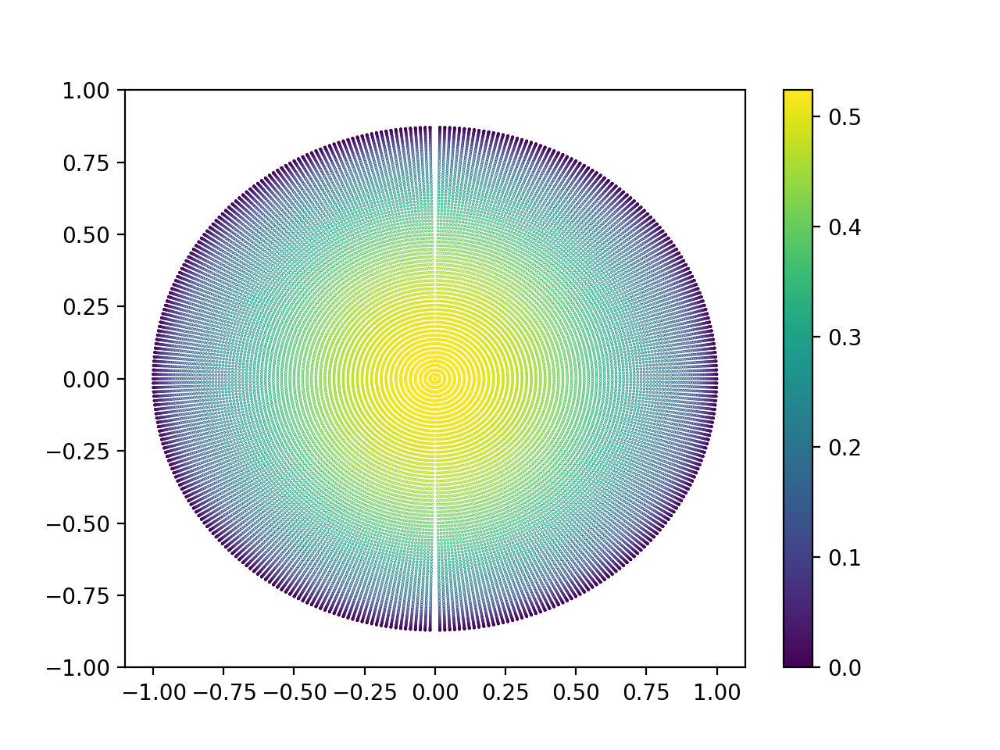

In [31]:
newy = y/ratio
newphi = np.arctan2(newy,x)
newtheta = np.arcsin(x/np.cos(newphi))
newcx = np.cos(newphi)*np.sin(newtheta)
newcy = np.sin(newphi)*np.sin(newtheta)
plt.figure(3)
sc = plt.scatter(newcx,newcy,c = truncategain, s = 0.1)
plt.ylim(-1,1)
plt.colorbar(sc)

<IPython.core.display.Javascript object>


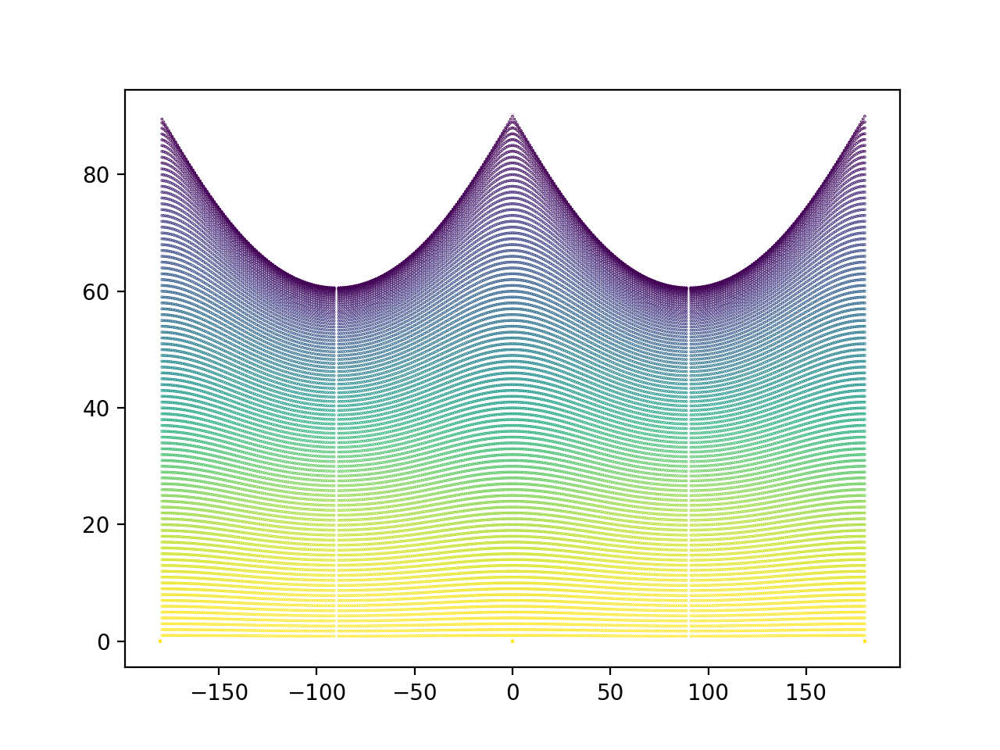

In [32]:
plt.figure(29)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = truncategain,s=0.1)

In [137]:
sigma = 0.6612*180/np.pi
#make sigma a input parameter
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u[i][j]**p
        terms.append(term)
        p += 1
    print(terms)
    
def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(358):
            q += (array[theta*358 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(newtheta*180/np.pi, newphi*180/np.pi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(358,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-10)
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [138]:
TDH20 = TDH(20)

In [139]:
TDHcube = []
count = 0
for i in range(20):
    TDHcube.append(TDH20[:,:(count+i+1)])
    count += i+1

In [ ]:
plt.figure(8)
plt.scatter(newcx,newcy,c = model1(),s=0.1)

<IPython.core.display.Javascript object>


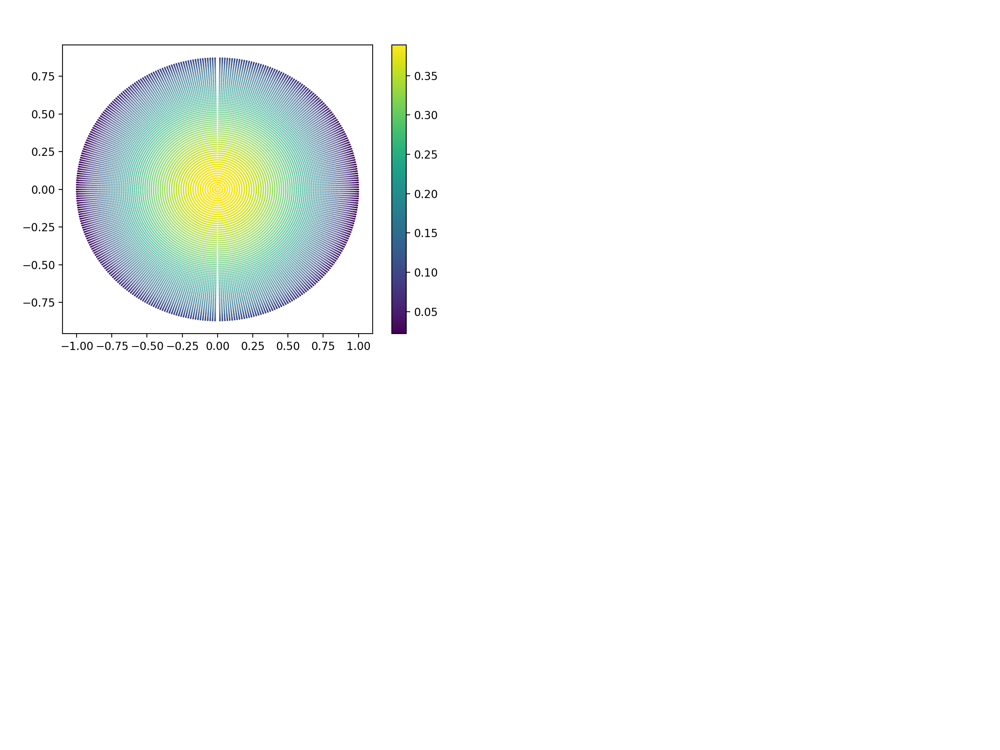

In [168]:
plt.figure(7)
plt.scatter(newcx,newcy,c = np.array(TDH20.T[0].T),s=0.1)
plt.colorbar()

<IPython.core.display.Javascript object>


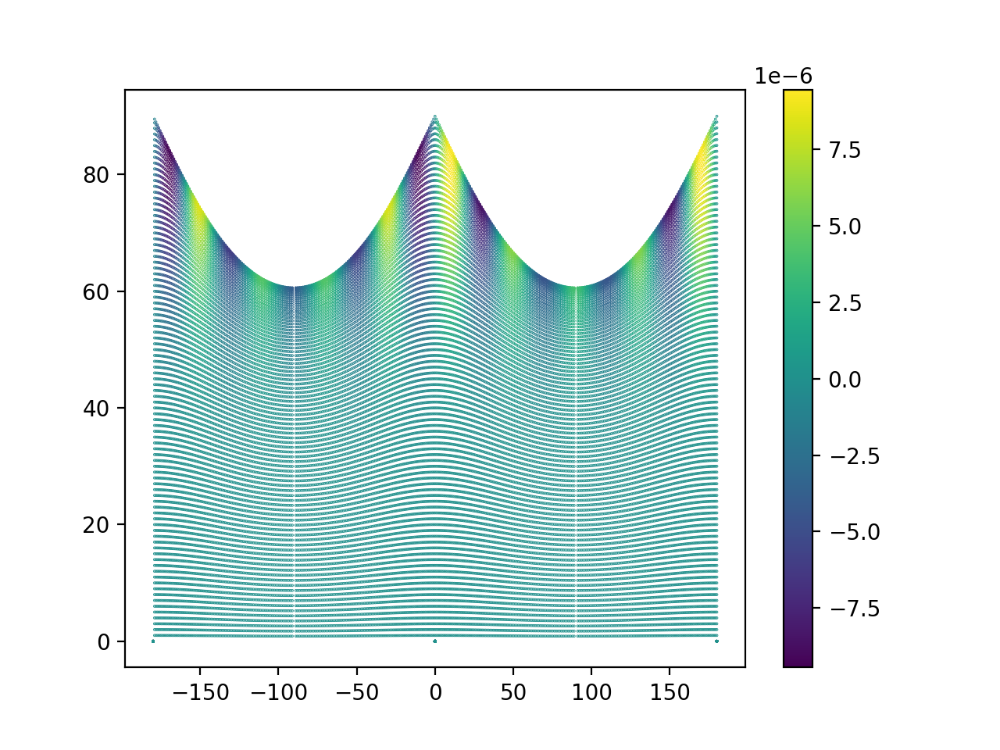

In [166]:
plt.figure(4)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = np.array(TDH20.T[100].T),s=0.1)
plt.colorbar()

In [145]:
resi = np.matrix(truncategain)
coetotal = []
frtotal = []
covtotal = []
fittingmodeltotal = []
for i in range(20):
    A = TDHcube[i]
    coe = solve(A,resi.T)
    finalresi = residual2D(A,resi.T)
    fittingmodel = np.matmul(A, coe)
    fittingmodel2D = fittingmodel.reshape(358,91)
    cov = covariance(A, resi.T)
    coetotal.append(coe)
    frtotal.append(finalresi)
    covtotal.append(cov)
    fittingmodeltotal.append(fittingmodel2D)

In [146]:
sigmatotal = []
for i in covtotal:
    sigmatotal.append(np.diag(i))
pctotal = []
for i in range(20):
    meansquare = np.sum(np.multiply(frtotal[i],frtotal[i]))/(358*91)
    rms = np.sqrt(meansquare)
    pctotal.append(rms/np.max(gain[0])*100)

<IPython.core.display.Javascript object>


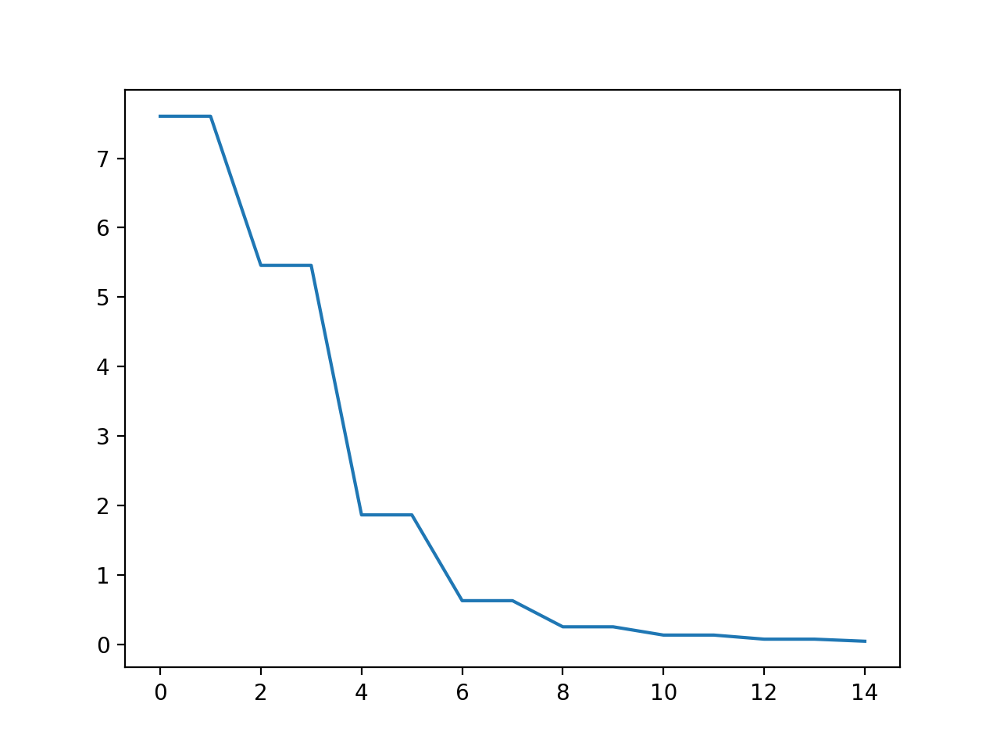

In [108]:
plt.figure(100)
plt.plot(pctotal[:15])
plt.show()

<IPython.core.display.Javascript object>


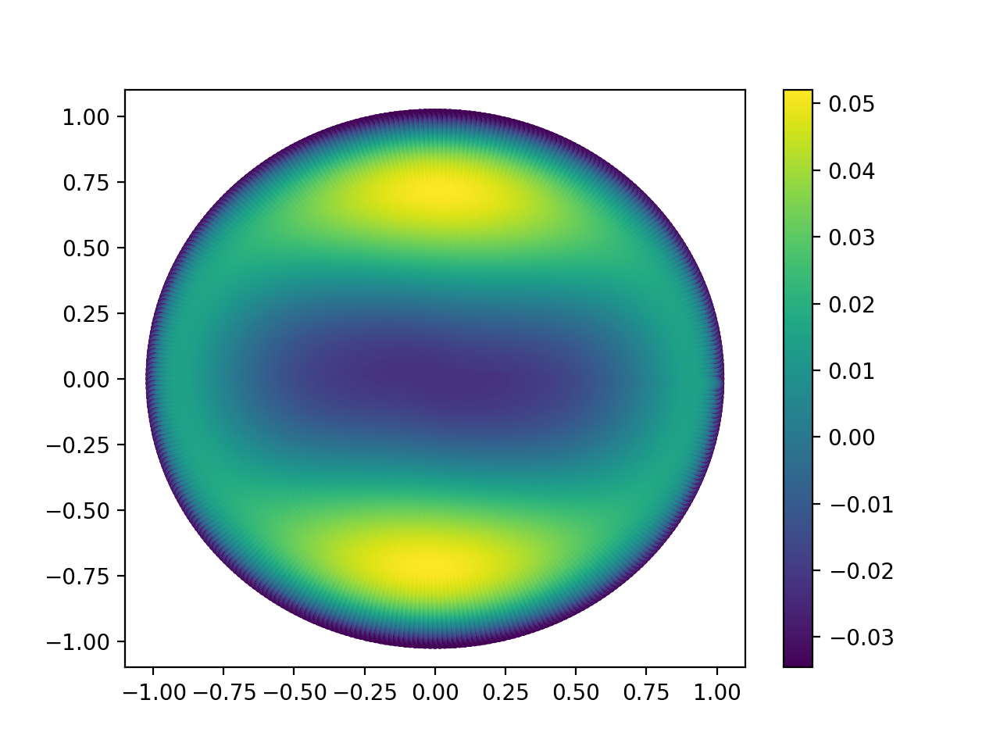

In [201]:
plt.figure(111)
plt.scatter(xw,yw,c = np.array(frtotalwo[0].flatten()))
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


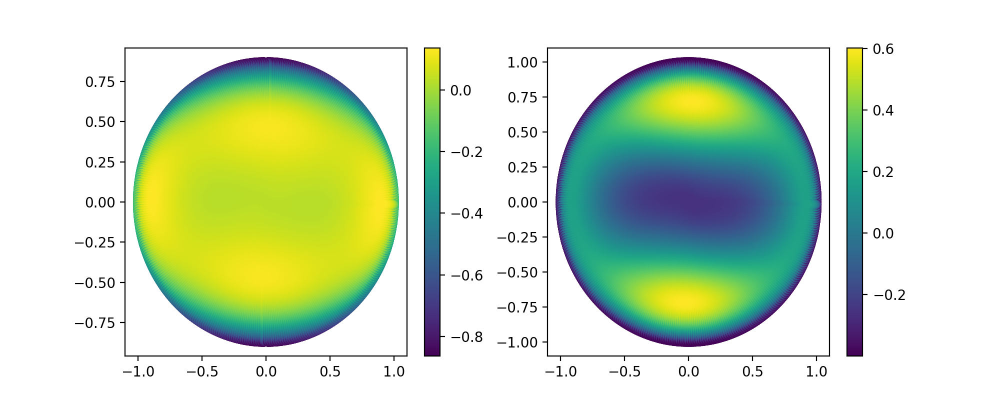

In [214]:
plt.figure(40,figsize = [10,4])
plt.subplot(1, 2, 1)
plt.scatter(newcx,newcy,c = np.array(frtotal[0].flatten())/(np.max(frtotal[0])-np.min(frtotal[0])))
plt.colorbar()
plt.subplot(1, 2, 2)
plt.scatter(xw,yw,c = np.array(frtotalwo[0].flatten())/(np.max(frtotalwo[0])-np.min(frtotalwo[0])))
plt.colorbar()

<IPython.core.display.Javascript object>


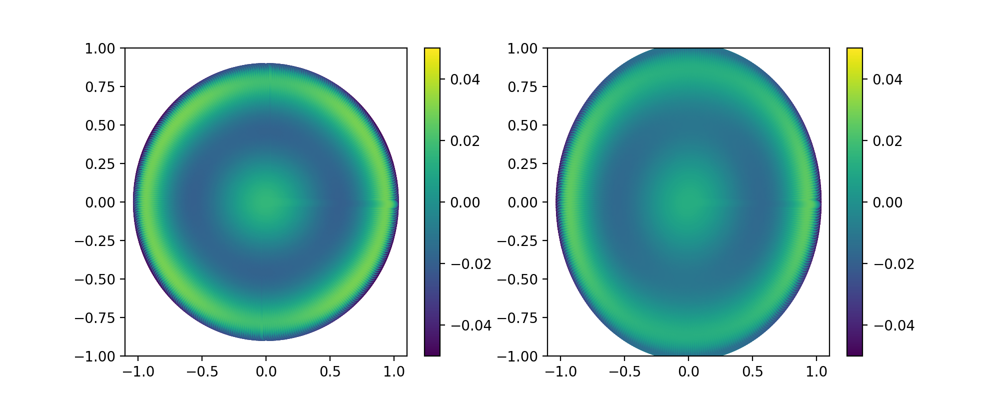

In [226]:
plt.figure(41,figsize = [10,4])
plt.subplot(1, 2, 1)
plt.scatter(newcx,newcy,c = np.array(frtotal[5].flatten())/np.max(gain[0]),vmin = -0.05,vmax = 0.05)
plt.ylim(-1,1)
plt.colorbar()
plt.subplot(1, 2, 2)
plt.scatter(xw,yw,c = np.array(frtotalwo[5].flatten())/np.max(gain[0]),vmin = -0.05,vmax = 0.05,)
plt.ylim(-1,1)

plt.colorbar()

In [197]:
pctotal[5]

1.8654908481821302

In [177]:
frtotal[1].flatten().shape,newcx.shape

((1, 32578), (32578,))

<IPython.core.display.Javascript object>


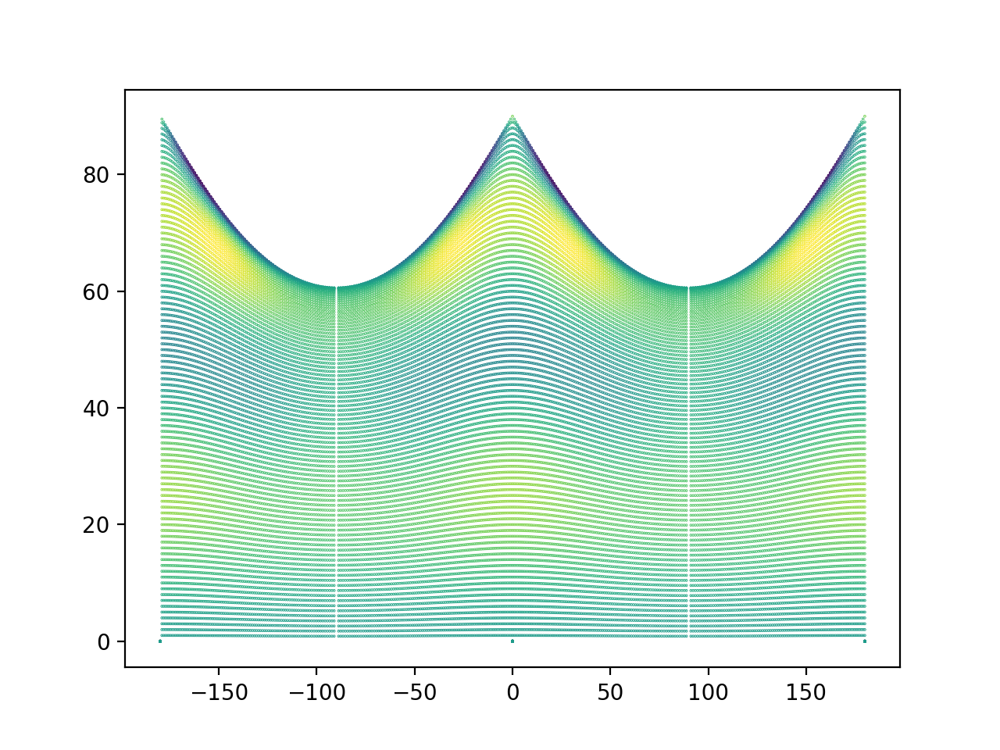

In [96]:
plt.figure(410)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = np.array(frtotal[6].ravel()),s=0.1)

In [122]:
#Without change
sigma = 0.6612*180/np.pi
#make sigma a input parameter
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3
    
def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(theta, phi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(theta,phi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(360,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-10)
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [124]:
TDH20 = TDH(20)

In [129]:
TDHcube = []
count = 0
for i in range(20):
    TDHcube.append(TDH20[:,:(count+i+1)])
    count += i+1

In [130]:
resi = np.matrix(gain[0].T.flatten())
coetotalwo = []
frtotalwo = []
covtotalwo = []
fittingmodeltotalwo = []
for i in range(20):
    A = TDHcube[i]
    coe = solve(A,resi.T)
    finalresi = residual2D(A,resi.T)
    fittingmodel = np.matmul(A, coe)
    fittingmodel2D = fittingmodel.reshape(360,91)
    cov = covariance(A, resi.T)
    coetotalwo.append(coe)
    frtotalwo.append(finalresi)
    covtotalwo.append(cov)
    fittingmodeltotalwo.append(fittingmodel2D)

In [131]:
sigmatotalwo = []
for i in covtotalwo:
    sigmatotalwo.append(np.diag(i))
pctotalwo = []
for i in range(20):
    meansquare = np.sum(np.multiply(frtotalwo[i],frtotalwo[i]))/(358*91)
    rms = np.sqrt(meansquare)
    pctotalwo.append(rms/np.max(gain[0])*100)

<IPython.core.display.Javascript object>


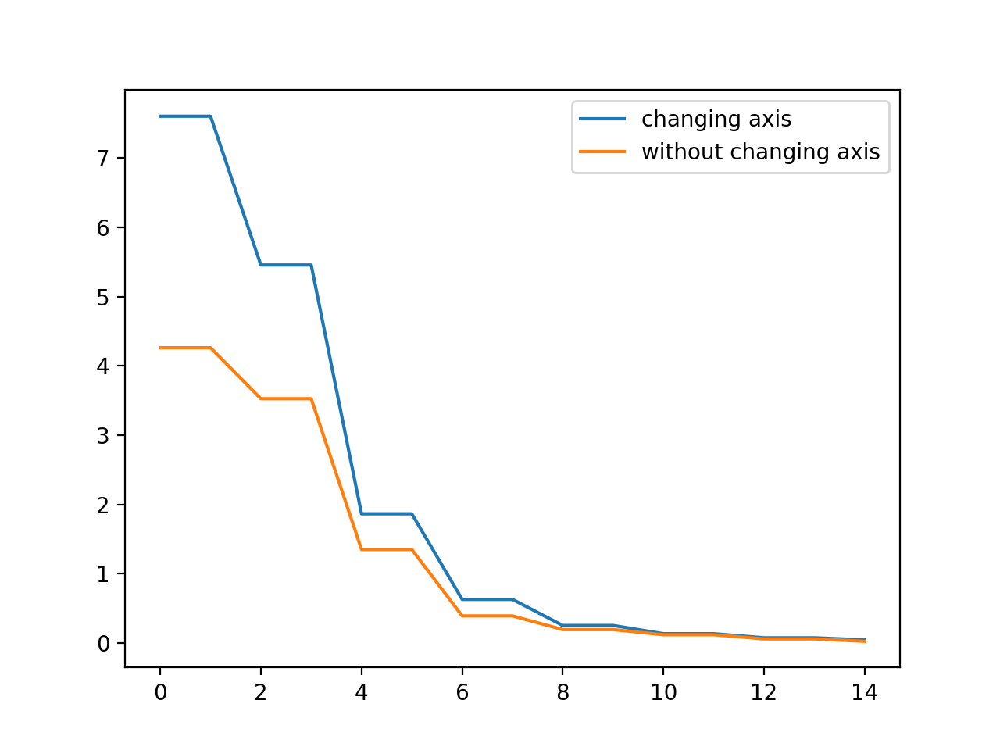

In [134]:
plt.figure(110)
plt.plot(pctotal[:15], label = "changing axis")
plt.plot(pctotalwo[:15], label = "without changing axis")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


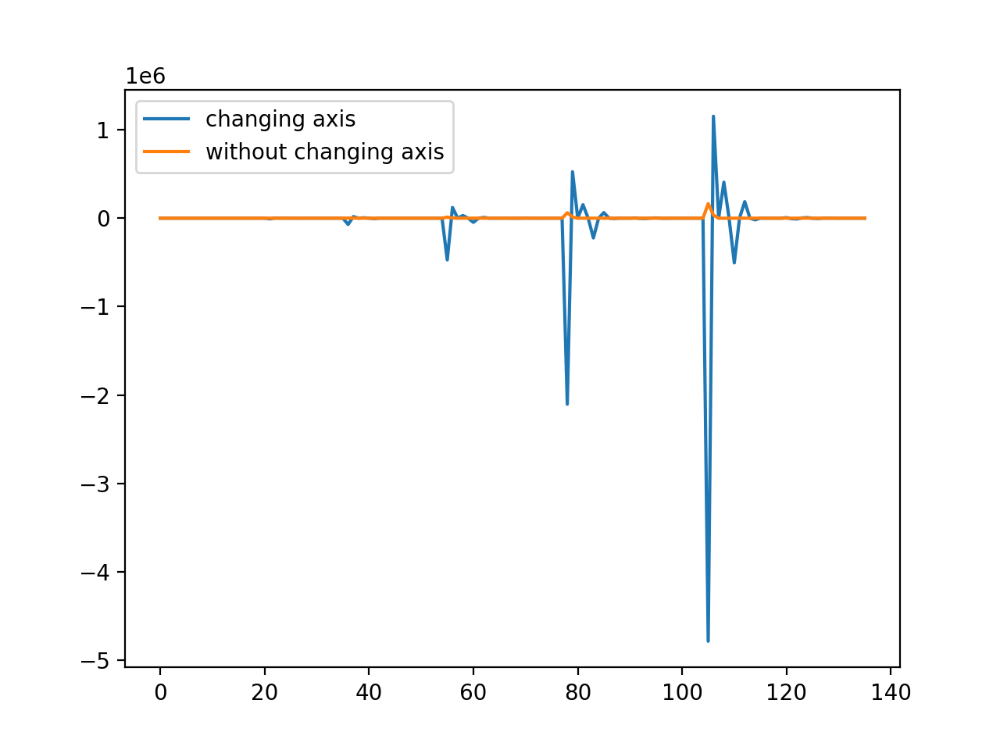

In [149]:
plt.figure(120)
plt.plot(coetotal[15], label = "changing axis")
plt.plot(coetotalwo[15], label = "without changing axis")
plt.legend()
plt.show()

In [147]:
len(coetotal)

20

In [4]:
gain.shape

(101, 91, 360)

In [40]:
gain125 = gain[-1]

In [41]:
cov = np.cov(gain125)

In [42]:
cov.shape

(91, 91)

In [43]:
u,s,v = np.linalg.svd(cov)

In [44]:
v.shape

(91, 91)

<IPython.core.display.Javascript object>


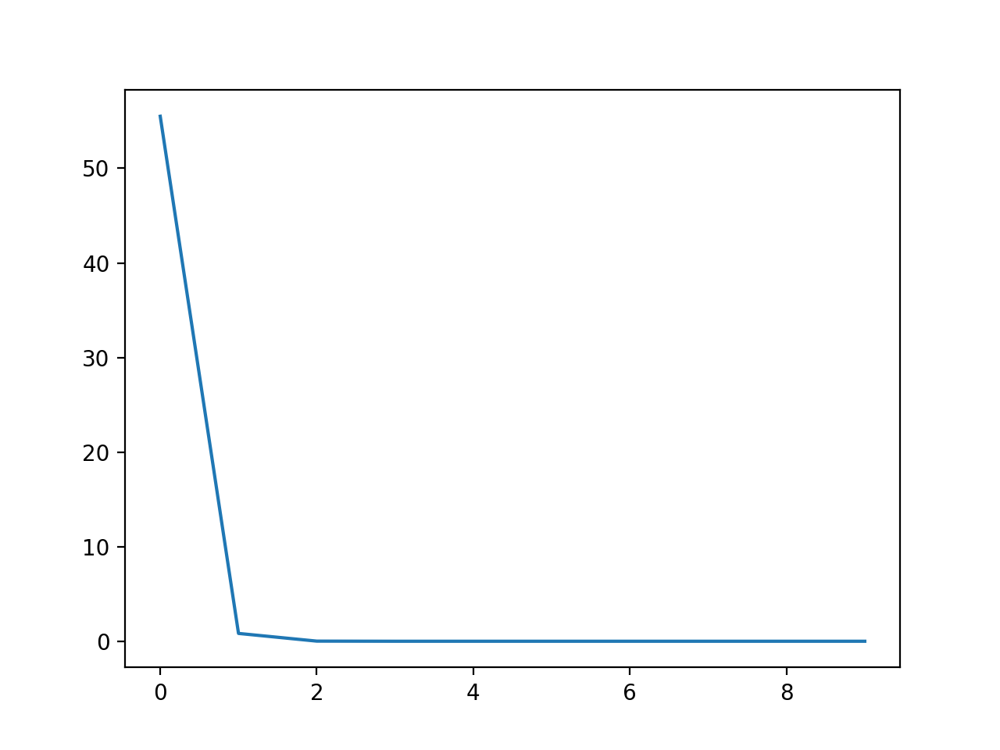

In [46]:
plt.plot(s[:10])